## Exercise 1:

In [1]:
import cv2
import glob
import numpy as np
from queue import PriorityQueue
import matplotlib.pyplot as plt

############################################################
#
#              Simple Image Retrieval
#
############################################################


# implement distance function
def distance(a, b):
    # YOUR CODE HERE
    return np.linalg.norm(a-b)


def create_keypoints(w, h):
    keypoints = []
    keypointSize = 11
    # please sample the image uniformly in a grid
    # find the keypoint size and number of sample points
    # as hyperparameters
    grid_size=16

    for r in range(0,h,grid_size):
        for c in range(0,w,grid_size):
            ## the region around each keypoint for feature extraction.
            keypoints.append(cv2.KeyPoint(float(c),float(r),size=keypointSize))

    return keypoints

def createDescriptorList():
    
    # 1. preprocessing and load
    images = glob.glob('images/db/train/*/*.jpg')
    
    # 2. create keypoints on a regular grid (cv2.KeyPoint(r, c, keypointSize), as keypoint size use e.g. 11)
    descriptors_list = []
    sift=cv2.SIFT_create()
    keypoints = create_keypoints(256, 256)
    
    
    # 3. use the keypoints for each image and compute SIFT descriptors
    #    for each keypoint. this compute one descriptor for each image.
    
    for img_path in images:
        img=cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            continue
    
        ## resize the image to match the keypoints grid size
        img=cv2.resize(img,(256,256))
    
        ## compute descriptors keypoints
        _,descriptors=sift.compute(img,keypoints)
        descriptors_list.append((img_path,descriptors))

    return descriptors_list,keypoints,sift


def display_image_in_notebook(img, title="Image"):
    """Display a single image in the notebook."""
    # Convert the image from BGR (OpenCV) to RGB (Matplotlib)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.title(title)
    plt.axis('off')
    plt.show()
    

# 4. use one of the query input image to query the 'image database' that
#    now compress to a single area. Therefore extract the descriptor and
#    compare the descriptor to each image in the database using the L2-norm
#    and save the result into a priority queue (q = PriorityQueue())

def searchTheQueue(query_img_path,keypoints,descriptors_list,sift):
    query_image=cv2.imread(query_img_path,cv2.IMREAD_GRAYSCALE)
    query_image=cv2.resize(query_image,(256,256))
    _,query_descriptors=sift.compute(query_image,keypoints)
    
    ## priority queue o store results by smallest distance
    q=PriorityQueue()

    ## compare query descriptr to each image in the database
    for img_path,descriptors in descriptors_list:
        ## compute the average l2 distance between descriptors
        distances=[]
        for q_desc in query_descriptors:
            best_match=min([distance(q_desc,d_desc) for d_desc in descriptors])
            distances.append(best_match)
        avg_distance=np.mean(distances)
        q.put((avg_distance,img_path))

    # 5. output (save and/or display) the query results in the order of smallest distance
    while not q.empty():
        dist,img_path=q.get()
        print(f"Images: {img_path}, average distance: {dist}")
        img = cv2.imread(img_path)
        if img is not None:
            #cv2.imshow("Match", img)
            #cv2.waitKey(500)  # Display each image for 500 ms (adjust as needed)
            display_image_in_notebook(img, title="Image")
        else:
            print(f"Error: Could not load image at path {img_path}.")
    
    #cv2.destroyAllWindows()


Images: images/db/train/faces/face2.jpg, average distance: 313.8177795410156


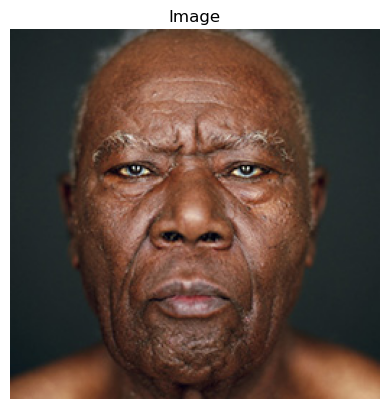

Images: images/db/train/faces/3573927657_df093bae27.jpg, average distance: 349.89410400390625


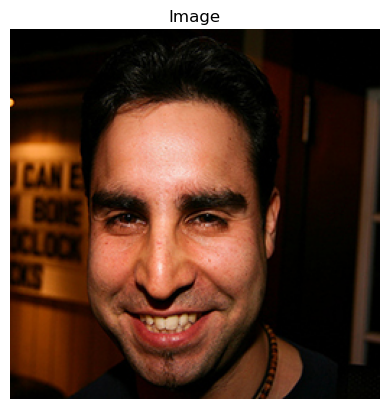

Images: images/db/train/faces/images.jpg, average distance: 364.41259765625


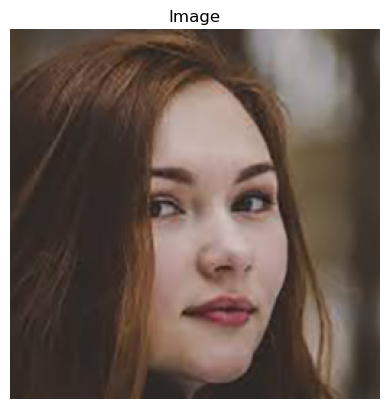

Images: images/db/train/flowers/0106476_1.jpg, average distance: 369.920654296875


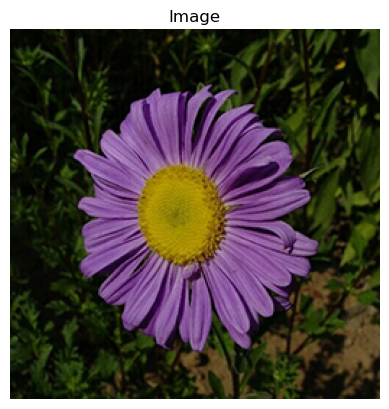

Images: images/db/train/faces/61060671.jpg, average distance: 379.23297119140625


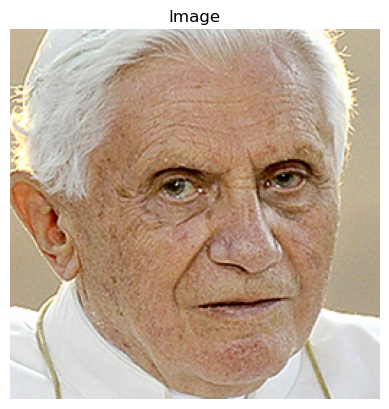

Images: images/db/train/flowers/astra04.jpg, average distance: 379.3464660644531


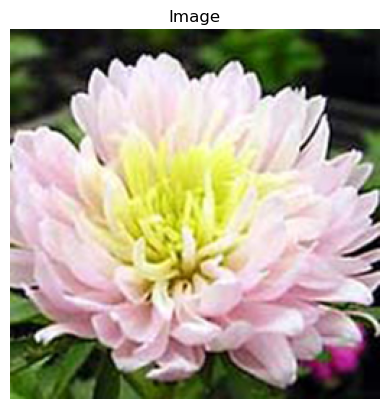

Images: images/db/train/flowers/marcinki.jpg, average distance: 385.681396484375


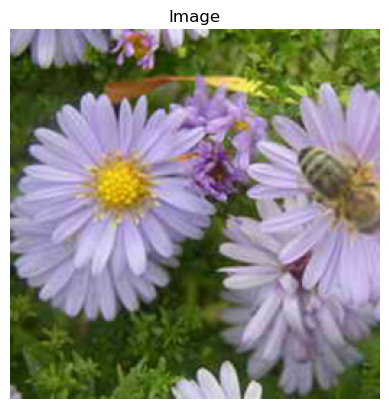

Images: images/db/train/faces/face.jpg, average distance: 386.6018371582031


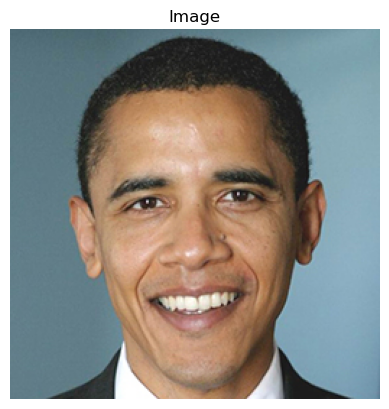

Images: images/db/train/faces/3775982780_d5ea306ce6.jpg, average distance: 387.5047912597656


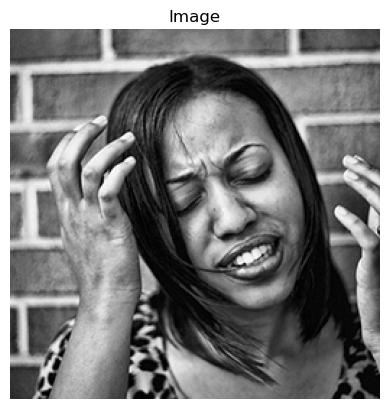

Images: images/db/train/flowers/3826419553_c00dc0e91c.jpg, average distance: 388.13836669921875


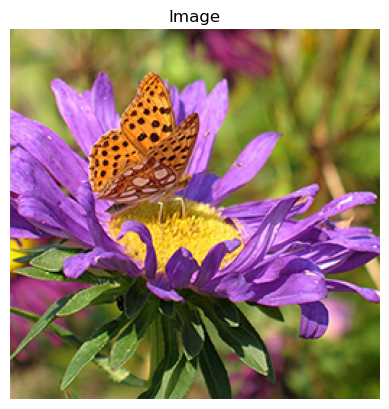

Images: images/db/train/cars/2539497709_756f025f62.jpg, average distance: 388.62530517578125


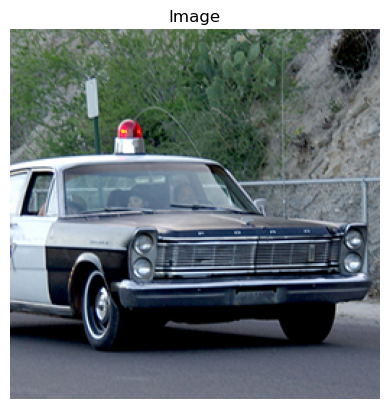

Images: images/db/train/faces/397642272_cedf622248_z.jpg, average distance: 388.9730224609375


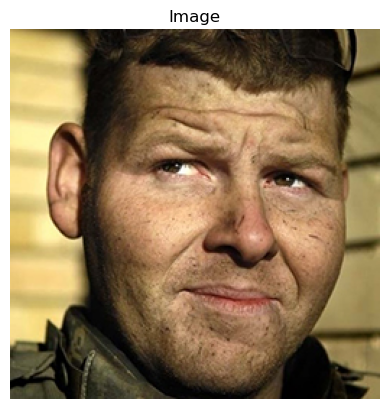

Images: images/db/train/faces/img_1577_crazy-face.jpg, average distance: 389.580322265625


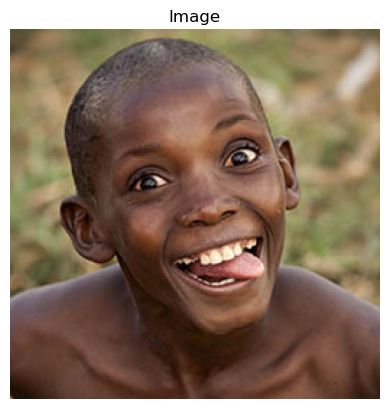

Images: images/db/train/cars/2847324790_6dd07ffb54.jpg, average distance: 392.3851623535156


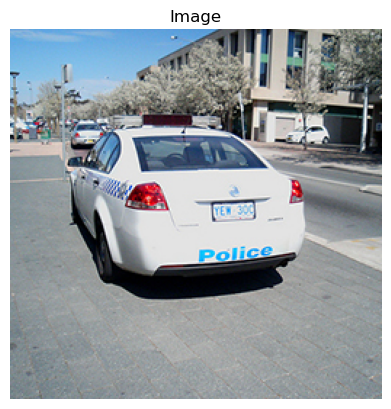

Images: images/db/train/flowers/ANBL.jpg, average distance: 397.6646728515625


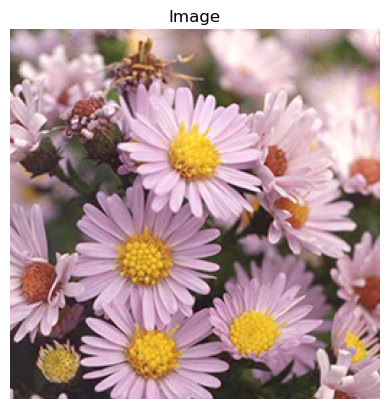

Images: images/db/train/cars/car003.jpg, average distance: 398.322998046875


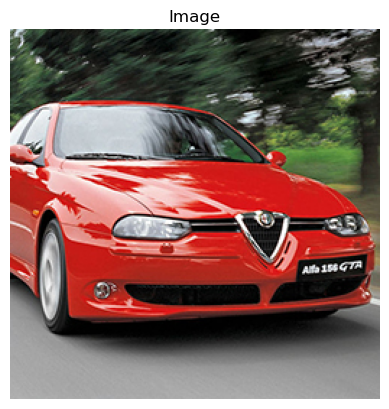

Images: images/db/train/cars/car002.jpg, average distance: 400.4571228027344


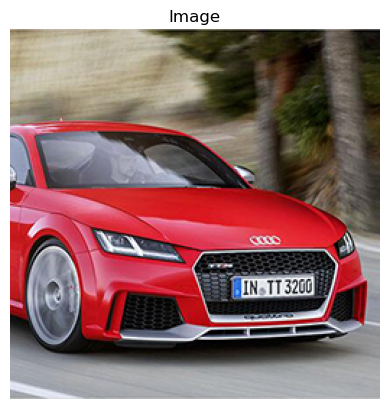

Images: images/db/train/cars/car001.jpg, average distance: 403.3605041503906


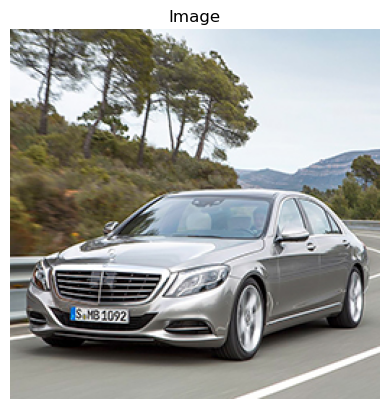

Images: images/db/train/flowers/2682530432_e470494b40.jpg, average distance: 403.5549011230469


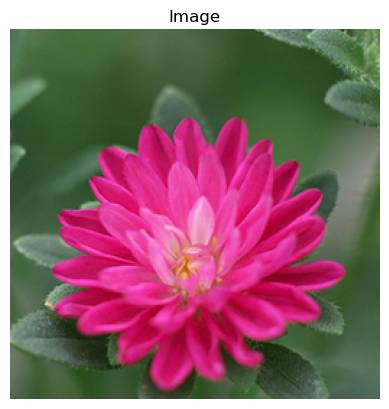

Images: images/db/train/cars/1137646735_2fb2752249.jpg, average distance: 413.2069091796875


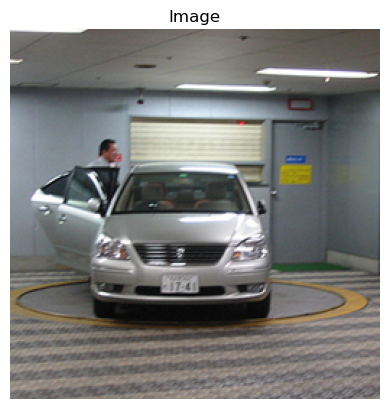

In [2]:
descriptors,keypoints,sift=createDescriptorList()
query_img_path="images/db/test/face.jpg"
searchTheQueue(query_img_path,keypoints,descriptors,sift)

Images: images/db/train/flowers/astra04.jpg, average distance: 368.8126220703125


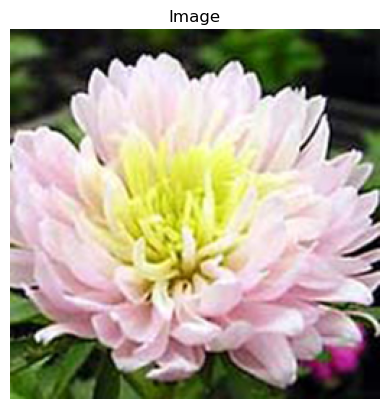

Images: images/db/train/flowers/0106476_1.jpg, average distance: 372.1339111328125


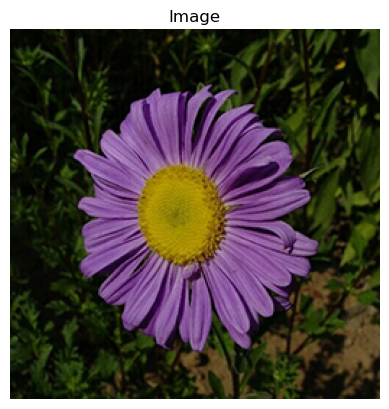

Images: images/db/train/flowers/marcinki.jpg, average distance: 375.98065185546875


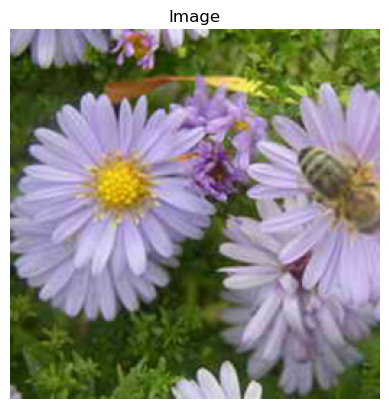

Images: images/db/train/flowers/ANBL.jpg, average distance: 388.0357360839844


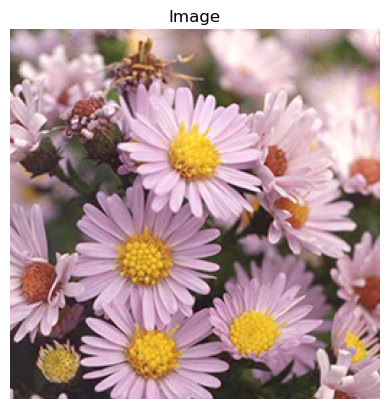

Images: images/db/train/flowers/3826419553_c00dc0e91c.jpg, average distance: 392.9886779785156


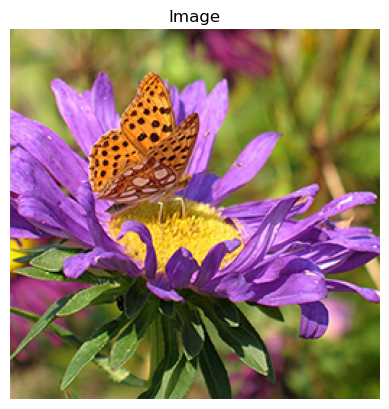

Images: images/db/train/faces/face2.jpg, average distance: 393.12786865234375


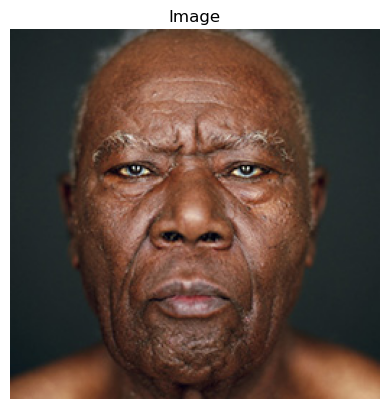

Images: images/db/train/flowers/2682530432_e470494b40.jpg, average distance: 394.1220397949219


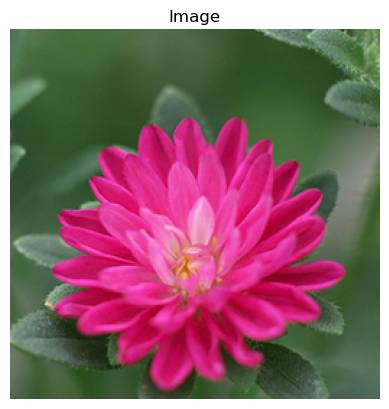

Images: images/db/train/cars/2847324790_6dd07ffb54.jpg, average distance: 394.615234375


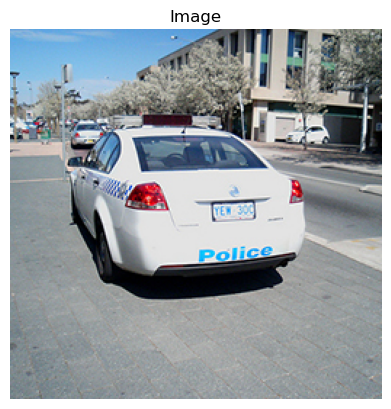

Images: images/db/train/cars/car001.jpg, average distance: 398.7431640625


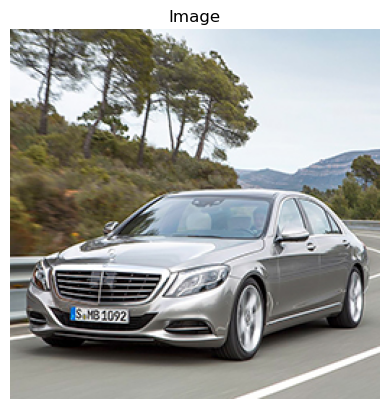

Images: images/db/train/faces/img_1577_crazy-face.jpg, average distance: 400.1805419921875


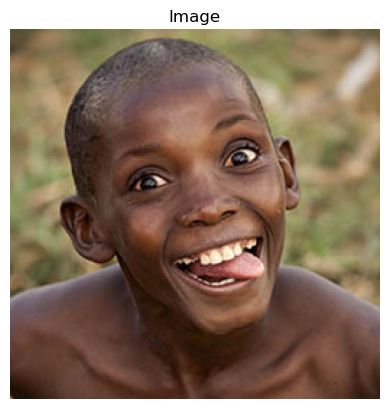

Images: images/db/train/faces/3573927657_df093bae27.jpg, average distance: 401.5284729003906


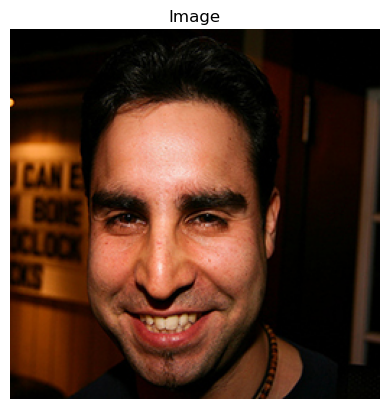

Images: images/db/train/faces/61060671.jpg, average distance: 405.84686279296875


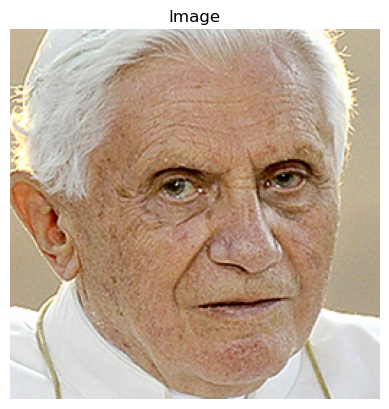

Images: images/db/train/cars/2539497709_756f025f62.jpg, average distance: 406.55950927734375


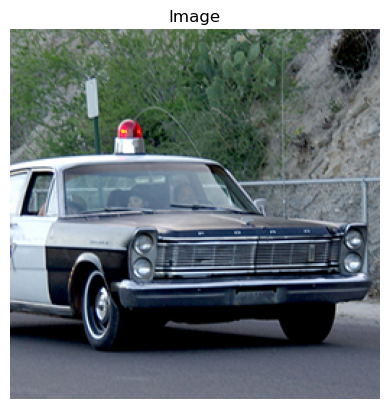

Images: images/db/train/cars/car003.jpg, average distance: 408.69482421875


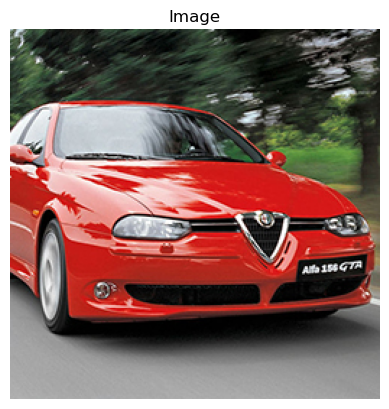

Images: images/db/train/faces/3775982780_d5ea306ce6.jpg, average distance: 412.6674499511719


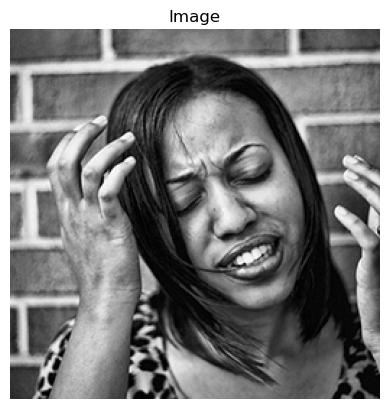

Images: images/db/train/cars/car002.jpg, average distance: 414.2637939453125


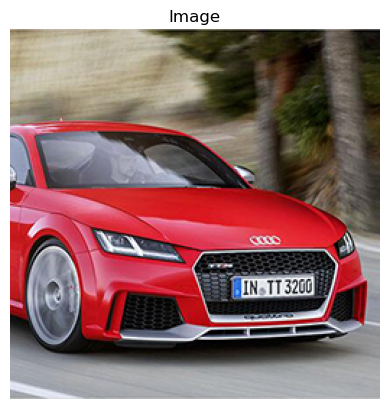

Images: images/db/train/faces/397642272_cedf622248_z.jpg, average distance: 414.8544616699219


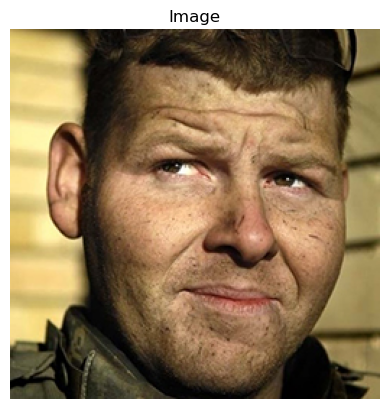

Images: images/db/train/faces/face.jpg, average distance: 415.4092712402344


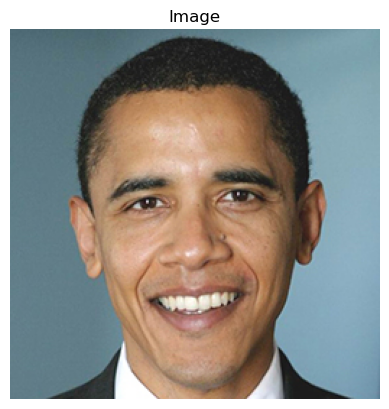

Images: images/db/train/faces/images.jpg, average distance: 418.6684875488281


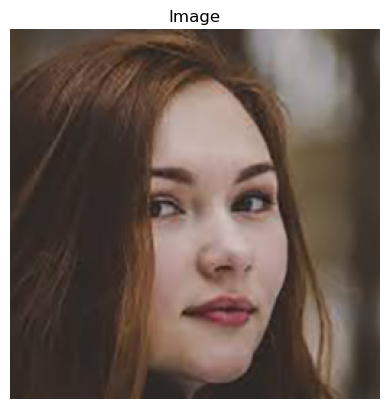

Images: images/db/train/cars/1137646735_2fb2752249.jpg, average distance: 431.2635498046875


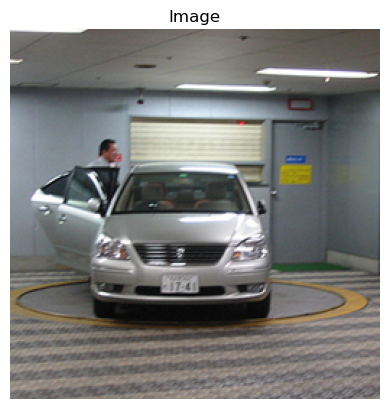

In [3]:
query_img_path="images/db/test/flower2.jpg"
searchTheQueue(query_img_path,keypoints,descriptors,sift)

Images: images/db/train/cars/car001.jpg, average distance: 312.319580078125


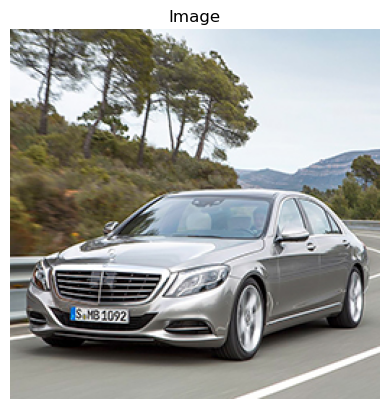

Images: images/db/train/cars/1137646735_2fb2752249.jpg, average distance: 313.62591552734375


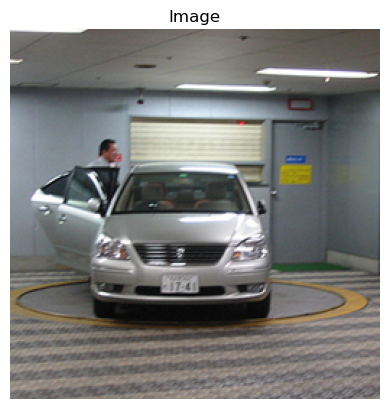

Images: images/db/train/cars/2539497709_756f025f62.jpg, average distance: 322.826904296875


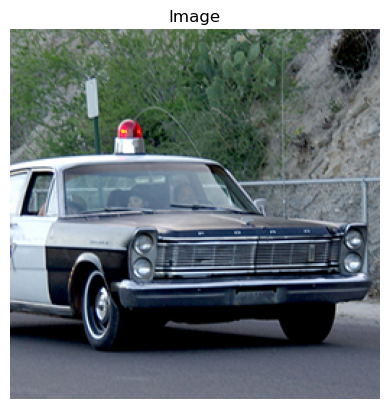

Images: images/db/train/cars/car002.jpg, average distance: 322.88037109375


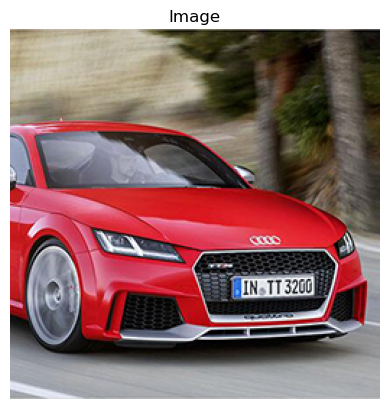

Images: images/db/train/cars/2847324790_6dd07ffb54.jpg, average distance: 328.55914306640625


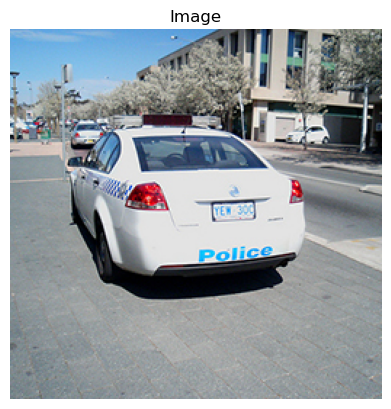

Images: images/db/train/cars/car003.jpg, average distance: 331.2120666503906


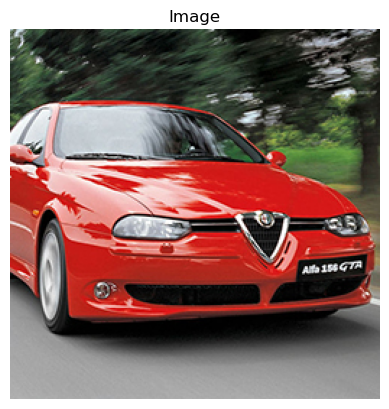

Images: images/db/train/faces/61060671.jpg, average distance: 373.4105224609375


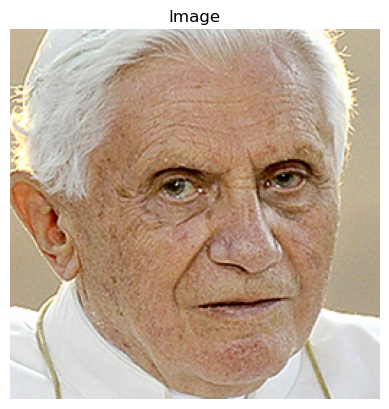

Images: images/db/train/faces/face.jpg, average distance: 391.848388671875


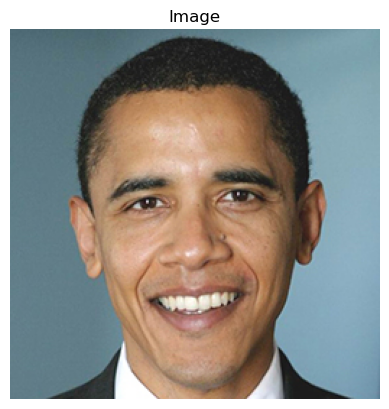

Images: images/db/train/flowers/2682530432_e470494b40.jpg, average distance: 392.47698974609375


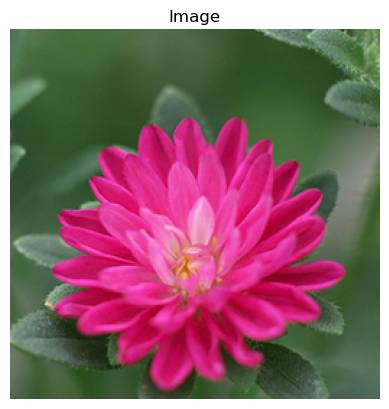

Images: images/db/train/faces/397642272_cedf622248_z.jpg, average distance: 394.3905944824219


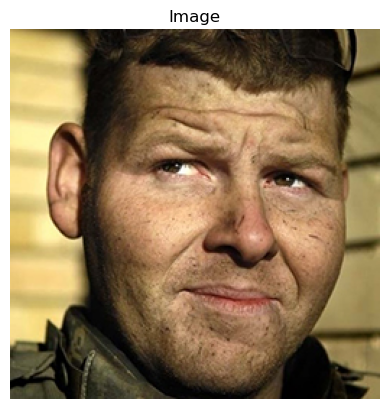

Images: images/db/train/faces/3775982780_d5ea306ce6.jpg, average distance: 394.47637939453125


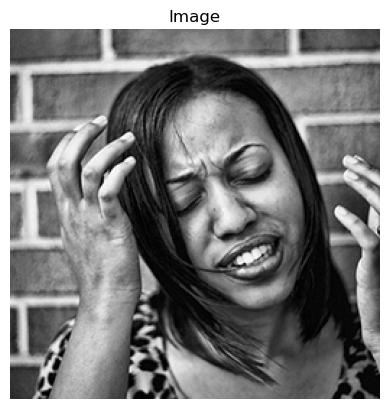

Images: images/db/train/faces/face2.jpg, average distance: 405.01544189453125


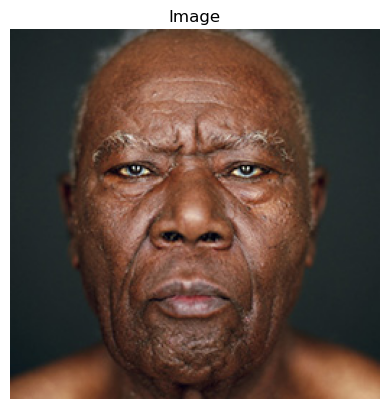

Images: images/db/train/flowers/astra04.jpg, average distance: 406.14837646484375


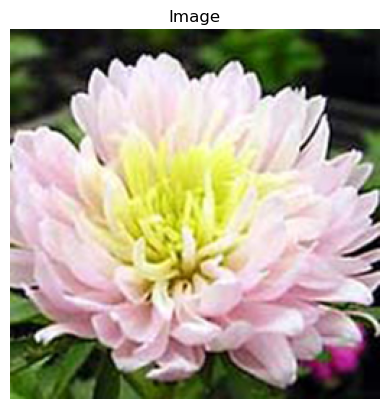

Images: images/db/train/faces/3573927657_df093bae27.jpg, average distance: 407.33587646484375


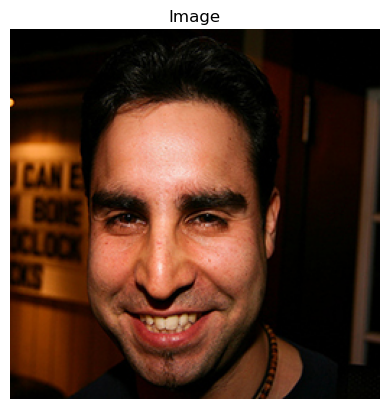

Images: images/db/train/faces/img_1577_crazy-face.jpg, average distance: 408.564208984375


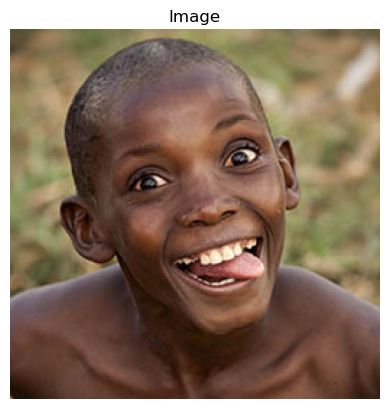

Images: images/db/train/flowers/3826419553_c00dc0e91c.jpg, average distance: 413.65924072265625


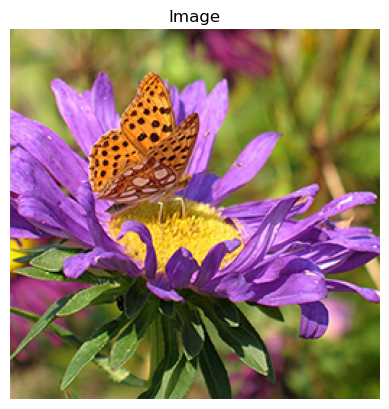

Images: images/db/train/faces/images.jpg, average distance: 423.31158447265625


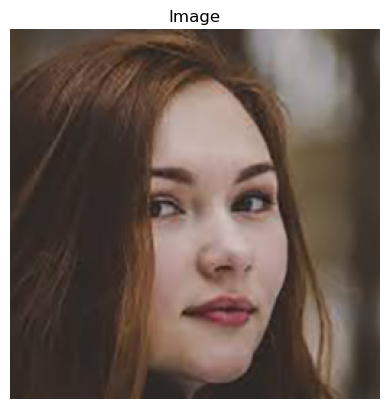

Images: images/db/train/flowers/0106476_1.jpg, average distance: 426.2137756347656


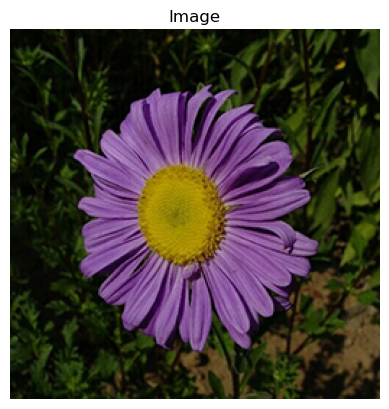

Images: images/db/train/flowers/marcinki.jpg, average distance: 426.8887634277344


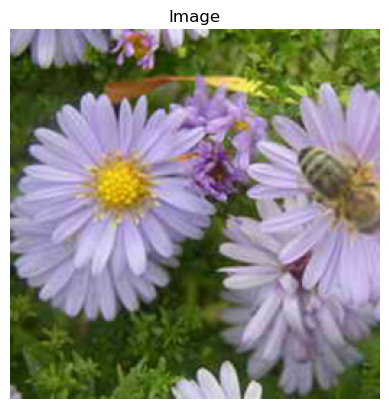

Images: images/db/train/flowers/ANBL.jpg, average distance: 428.437744140625


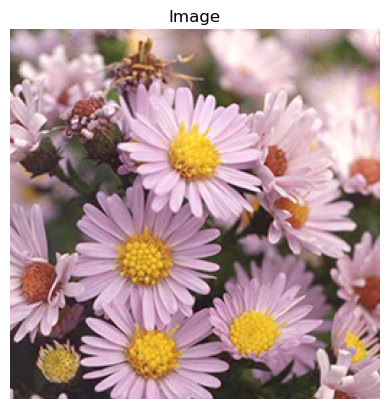

In [4]:
query_img_path="images/db/test/car.jpg"
searchTheQueue(query_img_path,keypoints,descriptors,sift)

## Exercise 2: Write your own image descriptor

[< cv2.KeyPoint 0x181bbad30>]
0
< cv2.KeyPoint 0x181bbad30>


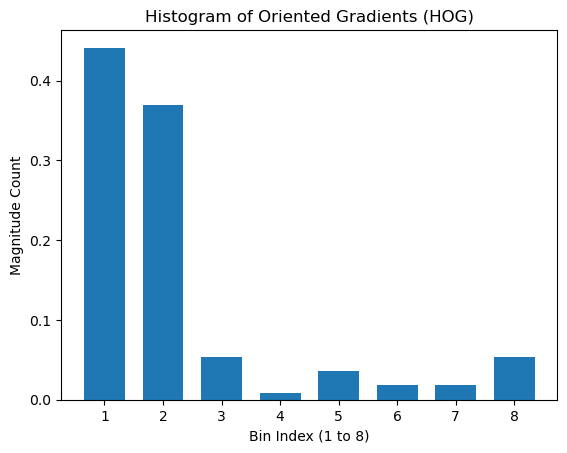

[< cv2.KeyPoint 0x181bbad30>]
0
< cv2.KeyPoint 0x181bbad30>


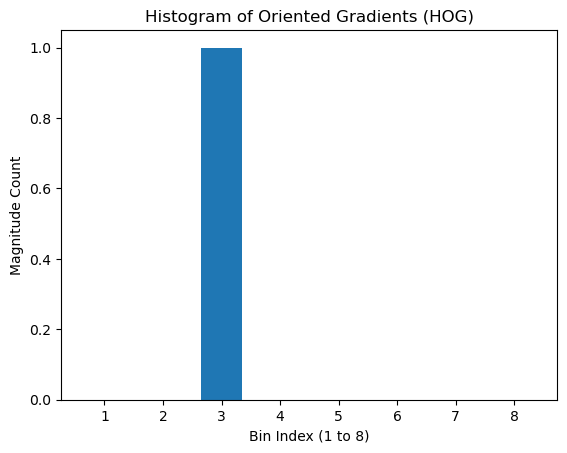

[< cv2.KeyPoint 0x181bbad30>]
0
< cv2.KeyPoint 0x181bbad30>


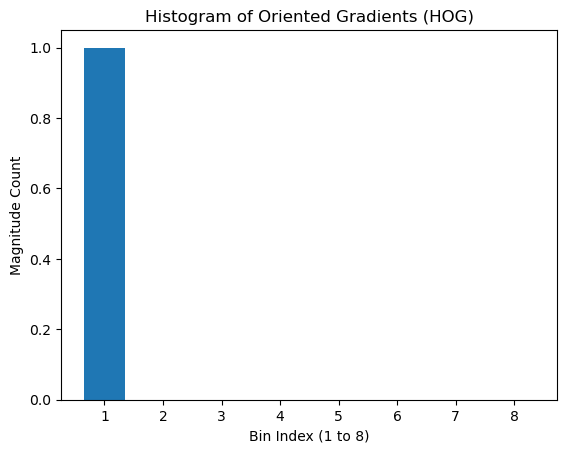

[< cv2.KeyPoint 0x181bbad30>]
0
< cv2.KeyPoint 0x181bbad30>


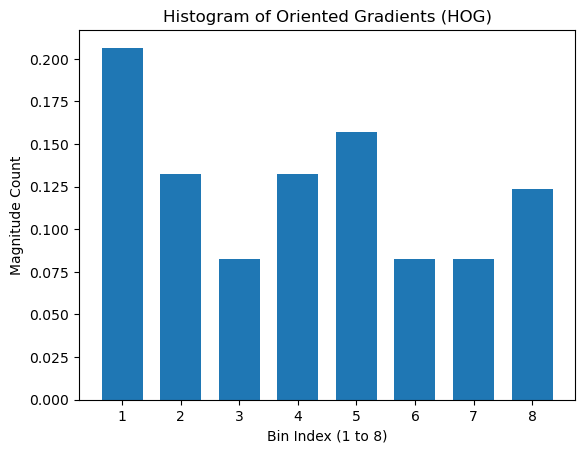

In [3]:
import numpy as np
import cv2
import math
import matplotlib
#matplotlib.use('TkAgg')
import matplotlib.pyplot as plt

###############################################################
#
# Write your own descriptor / Histogram of Oriented Gradients
#
###############################################################


def plot_histogram(hist, bins):
    width = 0.7 * (bins[1] - bins[0])
    center = (bins[:-1] + bins[1:]) / 2
    plt.bar(center, hist, align='center', width=width)
    plt.show()


def compute_simple_hog(imgcolor, keypoints, cell_size=11, num_bins=8):
    print(keypoints)

    # convert color to gray image and extract feature in gray
    img_gray=cv2.cvtColor(imgcolor,cv2.COLOR_BGR2GRAY)

    # compute x and y gradients (sobel kernel size 5)
    ##ddepth is output image depth; cv2.CV_32F: Float precision with slightly lower memory usage than CV_64F.
    ## dx=0 order of derivative in x direction - 0: no deeivative in x direction
    ## dy=1 order of derivative in y direction - 1: compute first derivative in y direction
    grad_x=cv2.Sobel(src=img_gray,ddepth=cv2.CV_32F,dx=1,dy=0,ksize=5)
    grad_y=cv2.Sobel(src=img_gray,ddepth=cv2.CV_32F,dx=0,dy=1,ksize=5)

    # compute magnitude and angle of the gradients
    magnitude=cv2.magnitude(grad_x,grad_y)
    angle=cv2.phase(grad_x, grad_y, angleInDegrees=True) ## # Gradient angle in degrees

    # go through all keypoints and and compute feature vector
    descr = np.zeros((len(keypoints), 8), np.float32) ## len keypointsx8 size of descriptor initially initialized with zero
    count = 0
    for kp in keypoints:
        print(count)
        print(kp)
        # print kp.pt, kp.size
        # extract angle in keypoint sub window
        # extract gradient magnitude in keypoint subwindow
        x,y=int(kp.pt[0]),int(kp.pt[1]) ##keypoint coordinate
        size=kp.size ## window size

        ## Extract region around the keypoint
        x_start = max(x - cell_size // 2, 0)
        x_end = min(x + cell_size // 2 + 1, img_gray.shape[1])
        y_start = max(y - cell_size // 2, 0)
        y_end = min(y + cell_size // 2 + 1, img_gray.shape[0])

        mag_patch = magnitude[y_start:y_end, x_start:x_end]
        angle_patch = angle[y_start:y_end, x_start:x_end]

        ## only consider pixels with non-zero gradient magnitude
        valid_mask = mag_patch > 0
        
        # Create histogram of angles weighted by magnitude
        hist, bins = np.histogram(
            angle_patch[valid_mask], bins=num_bins, range=(0, 360), density=True
        )

        # Normalize the histogram
        hist /= (hist.sum() + 1e-5)  # Avoid division by zero
        
        # Store the descriptor
        descr[count] = hist

        plot_histogram(hist, bins)

        descr[count] = hist

        count += 1

    return descr


keypoints = [cv2.KeyPoint(15, 15, 11)]
images=['./images/hog_test/diag.jpg','./images/hog_test/horiz.jpg','./images/hog_test/vert.jpg','./images/hog_test/circle.jpg']
for img in images:
    # test for all test images
    test = cv2.imread(img)
    descriptor = compute_simple_hog(test, keypoints)

## Using gradient magnitudes as weights ensures that stronger edges contribute more to the histogram, 
## while weaker edges contribute less. This improves the robustness of the descriptor by emphasizing dominant features in the patch.

## A patch of the image is divided into cells.
## For each cell, a histogram of gradient orientations is computed.
## The histograms of neighboring cells are grouped into blocks.
## Normalization is applied to these blocks to account for variations in gradient magnitudes across the image.
## Normalization ensures scale invariance and robustness to lighting and contrast variations.

## Exercise 3: Harris Corner Detector

In [1]:
import cv2
import numpy as np


# Load image and convert to gray and floating point
img = cv2.imread('./images/graffiti.png')
gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
gray = np.float32(gray)

# Define sobel filter and use cv2.filter2D to filter the grayscale image

sobel_x=np.array([[1,0,-1],[2,0,-2],[1,0,-1]],dtype=np.float32)
sobel_y=np.array([[1,2,1],[0,0,0],[-1,-2,-1]],dtype=np.float32)

# Compute G_xx, G_yy, G_xy and sum over all G_xx etc. 3x3 neighbors to compute
# entries of the matrix M = \sum_{3x3} [ G_xx Gxy; Gxy Gyy ]
# Note1: this results again in 3 images sumGxx, sumGyy, sumGxy
# Hint: to sum the neighbor values you can again use cv2.filter2D to do this efficiently

# ddepth: The depth of the output image (e.g., -1 means the output has the same depth as the input image).
# sobel_x,sobel_y are the kernels: The filter or kernel matrix that will be used to convolve with the image.
Ix=cv2.filter2D(gray,ddepth=-1,kernel=sobel_x)
Iy=cv2.filter2D(gray,ddepth=-1,kernel=sobel_y)

## compute the products of gradients
Ixx=Ix*Ix
Iyy=Iy*Iy
Ixy=Ix*Iy

# Use cv2.filter2D to sum the gradients over a 3x3 window
sum_Gxx = cv2.filter2D(Ixx, -1, np.ones((3, 3), dtype=np.float32))
sum_Gyy = cv2.filter2D(Iyy, -1, np.ones((3, 3), dtype=np.float32))
sum_Gxy = cv2.filter2D(Ixy, -1, np.ones((3, 3), dtype=np.float32))

# Define parameter
k = 0.04
threshold = 0.01

# Compute the determinat and trace of M using sumGxx, sumGyy, sumGxy. With det(M) and trace(M)
# you can compute the resulting image containing the harris corner responses with

# Compute the determinant and trace of M
det_M = (sum_Gxx * sum_Gyy) - (sum_Gxy ** 2)
trace_M = sum_Gxx + sum_Gyy
harris_response = det_M - k * (trace_M ** 2)

# Filter the harris 'image' with 'harris > threshold*harris.max()'
# this will give you the indices where values are above the threshold.
# These are the corner pixel you want to use

harris_thres = np.zeros_like(harris_response)
harris_thres[harris_response > threshold * harris_response.max()] = 255


# The OpenCV implementation looks like this - please do not change
harris_cv = cv2.cornerHarris(gray,3,3,k)

# intialize in black - set pixels with corners in with
harris_cv_thres = np.zeros(harris_cv.shape)
harris_cv_thres[harris_cv>threshold*harris_cv.max()]=[255]


# just for debugging to create such an image as seen
# in the assignment figure.
# img[harris>threshold*harris.max()]=[255,0,0]


# please leave this - adjust variable name if desired
print("====================================")
print("DIFF:", np.sum(np.absolute(harris_thres - harris_cv_thres)))
print("====================================")


cv2.imwrite("Harris_own.png", harris_thres)
cv2.imwrite("Harris_cv.png", harris_cv_thres)
cv2.imwrite("Image_with_Harris.png", img)

# cv2.namedWindow('Interactive Systems: Harris Corner')
# while True:
#     ch = cv2.waitKey(0)
#     if ch == 27:
#         break
#
#cv2.imshow('Harris Corner Detection (Own)', harris_thres)
#cv2.imshow('Harris Corner Detection (OpenCV)', harris_cv_thres)

#cv2.waitKey(0)
#cv2.destroyAllWindows()


DIFF: 0.0


True